##  DAG (Directed Acyclic Graph)

Integrantes: Santiago Afonso Osorio, Gonzalo Canavesio, Ignacio Martinez Goloboff

<img src="images/OC4QO6w.jpeg" />

##  ¿Que es un DAG?

* Un DAG (Directed Acyclic Graph) es un grafo dirigido que no contiene ciclos.
* Se utiliza para representar una serie de tareas o procesos que deben ejecutarse en un orden específico, donde cada tarea puede depender de otras.
* Cada nodo representa una tarea y las aristas representan las dependencias entre tareas.
* La ejecución de un DAG comienza en los nodos de entrada (sin dependencias) y avanza hacia los nodos de salida (sin tareas dependientes).

<img src="images/dag_2.avif" />


## Bonobo

Bonobo es un framework de ETL (Extract, Transform, Load) para Python que permite crear y ejecutar flujos de trabajo de procesamiento de datos. 

### Características principales de Bonobo:
* **Simplicidad**: Bonobo es fácil de usar y permite crear flujos de trabajo de manera rápida y sencilla.
* **Legibilidad**: El código de Bonobo es legible y fácil de entender, lo que facilita su mantenimiento y modificación. Al ser simple, es fácil para el aprendizaje.

<img src="images/WG5X6FXPXBHD5IS3ONZTMEO6PM.JPG" />

## Los DAGs en Bonobo

1. **Primero en entrar, primero en salir (FIFO)**: Cada nodo recibe las filas desde colas FIFO, preservando el orden. Sin embargo, cuando el grafo diverge en ramas diferentes y luego converge, el orden original no se mantiene en el punto de convergencia.
2. **Paralelismo**: Cada nodo se ejecuta en paralelo (por defecto, usando hilos independientes). Esto evita que llamadas bloqueantes (como esperar una base de datos o un servicio de red) detengan todo el proceso.
3. **Independencia**: Las filas son independientes entre sí, lo que hace que este enfoque sea ideal para el procesamiento línea por línea, pero menos adecuado para cálculos agrupados donde una salida depende de múltiples filas de entrada.

## Los DAGs en Bonobo (sus partes)

* **Nodos**: Representan las tareas o procesos individuales en el flujo de trabajo. Cualquier cosa, siempre que sea "callable" o iterable, puede ser un nodo.
* **Aristas**: Representan las dependencias entre los nodos. Las aristas conectan los nodos y definen el flujo de datos entre ellos.

## Tipos de nodos

* **General**: produce n resultados para cada entrada.
* **Extractor**: Extraen datos de una fuente externa, como una base de datos, un archivo o una API.
* **Cargador**: Cargan los datos transformados en un destino específico, como una base de datos, un archivo o un sistema de almacenamiento en la nube. No realiza transformaciones y devuelve los mismos datos que recibe.


## Procesamiento de Datos

<img src="images/0afBduI.png" />

Bonobo procesa datos en un flujo continuo y paralelo:

1. **A** extrae datos de una fuente (archivo, API, base de datos)
2. **B** transforma esos datos tan pronto como estén disponibles
3. **C** procesa los resultados de B inmediatamente

Mientras B y C procesan los primeros registros, A continúa extrayendo más datos.

Esta arquitectura de flujo permite:
- Mayor eficiencia al no esperar que se complete todo un paso
- Mejor uso de recursos computacionales
- Menor latencia en el procesamiento total

## Un poco de sintaxis

```python
import bonobo

# Paso 1: Fuente de datos (Extract)
def extract_foods():
    yield "apple"
    yield "banana"
    yield "cherry"

# Paso 2: Transformación (Transform)
def transform(food):
    yield food.capitalize()

# Paso 3: Carga (Load)
def load(food):
    print(f"Processed: {food}")

# Crear el grafo ETL
def get_graph():
    graph = bonobo.Graph()
    graph.add_chain(
        extract,     # Extrae los datos
        transform,   # Los transforma
        load         # Los carga (en este caso, imprime)
    )
    return graph

# Ejecutar el pipeline
if __name__ == "__main__":
    bonobo.run(get_graph())
```

## Patrones de DAGs en Bonobo (Grafo con divergencia)

En este caso, cada fila de salida de A se envía simultáneamente tanto a B como a C.

A continuará su procesamiento mientras B y C trabajan en paralelo.

<img src="images/oJ1t2Pc.png" />

```python
def get_graph():
    graph = bonobo.Graph()
    graph >> A >> B
    graph.get_cursor(A) >> C
    return graph
```

## Patrones de DAGs en Bonobo (Grafo con unión)

Alimentamos C con las salidas de A y B. No es una "unión" o "producto cartesiano",
sino simplemente dos tuberías diferentes conectadas a la entrada de C. 

Cualquier dato que genere alguna de ellas se enviará a C, una fila a la vez.

<img src="images/0afBmuI.png" />

```python
def get_graph():
    graph = bonobo.Graph()
    graph.get_cursor(None) >> C
    graph >> A >> C
    graph >> B >> C
    return graph
```


## Ejecución a prueba de fallos

La ejecución de nodos en Bonobo es tolerante a fallos:

- Si un nodo lanza una excepción al procesar una fila, solo se abortará el procesamiento de esa fila específica
- Bonobo mostrará el rastro del error (stack trace) y aumentará el contador de errores "err" para el contexto del nodo
- La ejecución continuará con la siguiente fila de entrada

Esta característica permite que los trabajos de ETL:
- Ignoren datos defectuosos
- Procesen la mayor cantidad posible de filas válidas
- Continúen la ejecución a pesar de problemas puntuales

## ¿Que cosa NO hace Bonobo?

Bonobo **no** es:

- **Una herramienta de análisis estadístico o ciencia de datos** que trate los conjuntos de datos como un todo. Si necesitas este enfoque, deberías considerar pandas.
- **Una solución de flujo de trabajo o programación** para tareas independientes de ingeniería de datos. Si buscas gestionar conjuntos de tareas de procesamiento como un todo, considera Airflow.
- **Una solución de big data**. Bonobo está orientado al procesamiento de datos de "pequeña escala", que puede ser enorme para humanos, pero no para computadoras.

Además, no se actualiza desde 2019...

<img src="images/bonobo_cry.png" />

##  Acerca de Luigi

* Es una librería de Python que ayuda a crear pipelines complejos de batch jobs
* Actúa como una herramienta de orquestación
* Maneja la resolución de dependencias y su visualización
* Gestión de workflows, fallas e integración con línea de comandos

<img src="images/luigi_logo.png" width=300 heigth=300 style="margin-top: 100px"/>

## Luigi: Origins at Spotify

Luigi fue desarrollado originalmente en Spotify por Erik Bernhardsson y Elias Freider en 2011, y lanzado como de código abierto en 2012. 

El propósito era automatizar las tareas involucradas en su servicio de transmisión de música y crear procesos reproducibles.

En principio necesitaban una herramienta para orquestar y gestionar el procesamiento de datos en su ecosistema Hadoop. 

No hay una historia oficial sobre el porqué del nombre

<img src="images/luigi.png" width=300 heigth=300 style="margin-top: 50px"/>

## Building workflows

Hay dos bloques fundamentales:

### Target

- Es una clase abstracta que actúa como un contenedor de datos arbitrarios
- Representa el resultado que una tarea debe generar y sirve como punto de referencia para saber si una tarea ya fue ejecutada correctamente

### Task

La clase Task es donde ocurre la lógica principal del cómputo.

Para definir su comportamiento, se pueden sobrescribir tres métodos clave:

- `run()`: contiene el código que realiza el trabajo
- `output()`: define el Target esperado como resultado de la tarea.
- `requires()`: declara las dependencias que deben completarse antes de ejecutar la tarea.



## Basics of Luigi



In [ ]:
import luigi

class GenerarDatos(luigi.Task):
    fecha = luigi.DateParameter()

    def output(self):
        return luigi.LocalTarget(f"data/datos_{self.fecha}.csv")

    def run(self):
        with self.output().open('w') as f:
            f.write("nombre,edad\n")
            f.write("messi,37\n")
            f.write("el bicho,40\n")
            f.write("mbappe,26\n")

class ProcesarDatos(luigi.Task):
    fecha = luigi.DateParameter()

    def requires(self):
        return GenerarDatos(fecha=self.fecha)

    def output(self):
        return luigi.LocalTarget(f"data/filtrado_{self.fecha}.csv")

    def run(self):
        with self.input().open('r') as infile, self.output().open('w') as outfile:
            header = infile.readline()
            outfile.write(header)
            for linea in infile:
                nombre, edad = linea.strip().split(',')
                if int(edad) >= 30:
                    outfile.write(f"{nombre},{edad}\n")


## Dynamic Dependencies and Priority

In [ ]:
@property
def priority(self):
    if self.numero > some_threshold:
        return 80
    else:
        return 40


In [ ]:
class TareaX(luigi.Task):
    cantidad = luigi.IntParameter(default=3)

    def run(self):
        # Crea dinámicamente una lista de subtareas
        for i in range(self.cantidad):
            self.set_status_message("zaraza")
            yield GenerarArchivo(numero=i)

## Componentes principales de la Arquitectura

###  Worker
- Ejecuta tareas, conteniendo información como el estado de ejecución, tiempo de ejecución, datos de error.
- Puede ejecutar múltiples tareas en paralelo (`--workers N`).
- Se comunica con el scheduler para saber qué ejecutar.


###  Central Scheduler
- Coordina todas las tareas y workers.
- Detecta qué tareas están pendientes, completadas o fallidas.
- Expone todo en una interfaz web en `http://localhost:8082`.



## Luigi UI

<img src="images/luigi_ui1.png" width=800 heigth=800/>

## Luigi UI

<img src="images/luigi_ui2.png" width=800 heigth=800/>

## Limitaciones de Luigi

### 1. Sin ejecución distribuida real
- Luigi no tiene un executor distribuido
- No puede repartir tareas automáticamente entre varias máquinas o contenedores.

### 2. No tiene scheduler de tiempo incorporado
- No podés programar tareas para que se ejecuten periódicamente.
- Requiere usar cron, Jenkins u otra herramienta externa.

### 3. Pobre manejo de errores y reintentos
- No tiene manejo sofisticado de fallos.
- Los reintentos y el control de errores deben implementarse manualmente.

### 4. Comunidad y mantenimiento reducidos
- Luigi ya no es prioridad ni siquiera para Spotify.

# Introducción a Apache Airflow

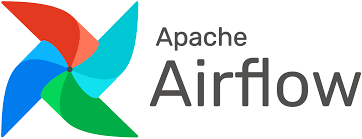


## ¿Cómo nace Apache Airflow?

- En **2014**, **Airbnb** enfrentaba un crecimiento explosivo en sus necesidades de datos.
- Usaban soluciones caseras para coordinar procesos ETL, análisis y reportes, pero eran difíciles de escalar y mantener.


- **Maxime Beauchemin**, ingeniero de datos en Airbnb, creó **Apache Airflow** como un proyecto interno.
- Se basó en estos principios:
  - *"Configuración como código"* → los flujos se definen en Python.
  - *"La orquestación no ejecuta, solo coordina"*
  - *"Todo debe ser observable y monitoreable"*


   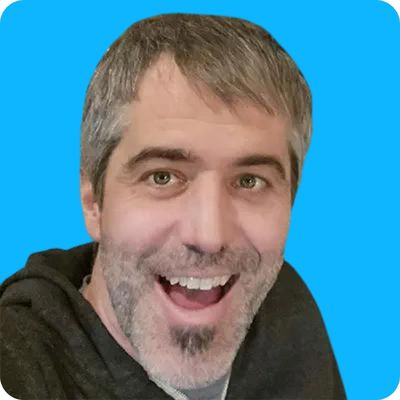

## ¿Qué es Airflow?

Es una plataforma de código abierto para desarrollar, programar y supervisar flujos de trabajo por lotes.

Airflow se puede ejecutar en diversas configuraciones, desde un único proceso en un portátil hasta un sistema distribuido capaz de gestionar cargas de trabajo masivas.

## Introducción a Airflow: Componentes clave de un DAG

Para entender cómo funciona **Apache Airflow**, es importante conocer los atributos principales de un **DAG** (*Directed Acyclic Graph*):

---

### `schedule`
Define **cuándo debe ejecutarse** el flujo de trabajo. Puede establecerse como:
- Una frecuencia predefinida (`@daily`, `@hourly`, etc.)
- Una expresión cron personalizada (`0 8 * * *`)

---

### `tasks`
Son **unidades de trabajo independientes**. Cada tarea ejecuta una función específica, como:
- Correr un script de Python
- Leer o escribir en una base de datos
- Enviar un correo, etc.

Cada `task` corre en un **worker** aislado.

---

### `task dependencies`
Definen **el orden de ejecución** entre tareas. Airflow construye un grafo dirigido acíclico (DAG) que respeta estas dependencias.

Por ejemplo:

A → B → C

Significa que `C` no puede ejecutarse hasta que `B` y `A` hayan finalizado correctamente.

---

### `callbacks`
Son **acciones automáticas** que se ejecutan al completarse el DAG o una tarea individual.

Ejemplos comunes:
- Enviar un correo si una tarea falla
- Registrar un log personalizado
- Llamar a una API de notificación

---



In [ ]:
from datetime import datetime

from airflow.sdk import DAG, task
from airflow.providers.standard.operators.bash import BashOperator

# A DAG represents a workflow, a collection of tasks
with DAG(dag_id="demo", start_date=datetime(2022, 1, 1), schedule="0 0 * * *") as dag:
    # Tasks are represented as operators
    hello = BashOperator(task_id="hello", bash_command="echo hello")

    @task()
    def airflow():
        print("airflow")

    # Set dependencies between tasks
    hello >> airflow()

## Ahora veremos como el DAG se muestra en la interfaz web

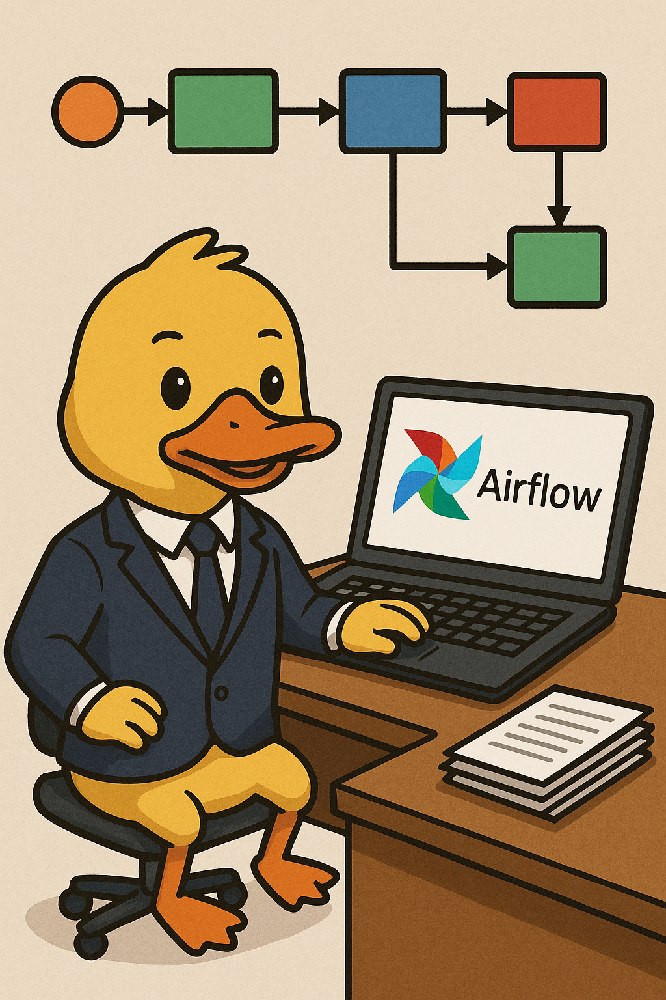

# airflow standalone (localhost)

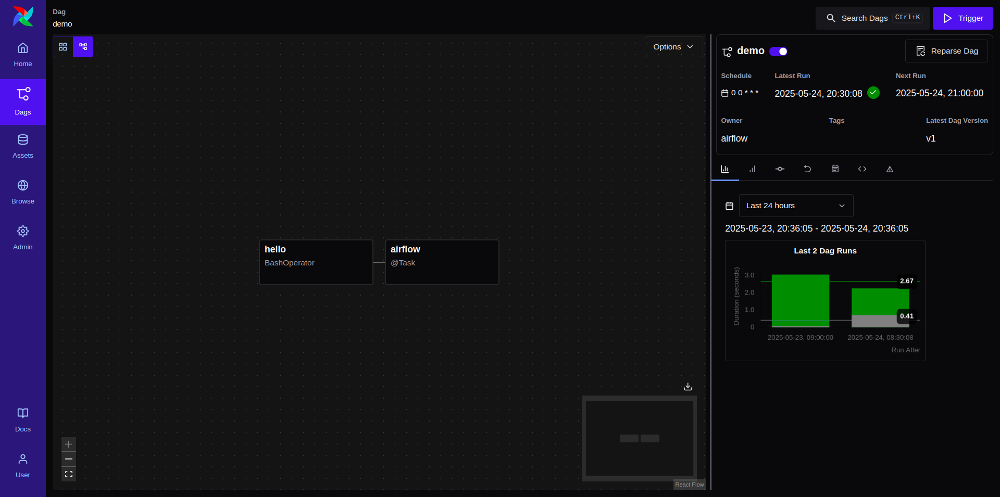

## Lo crucial de usar Airflow es su capacidad de escalar y orquestar tareas complejas de forma eficiente

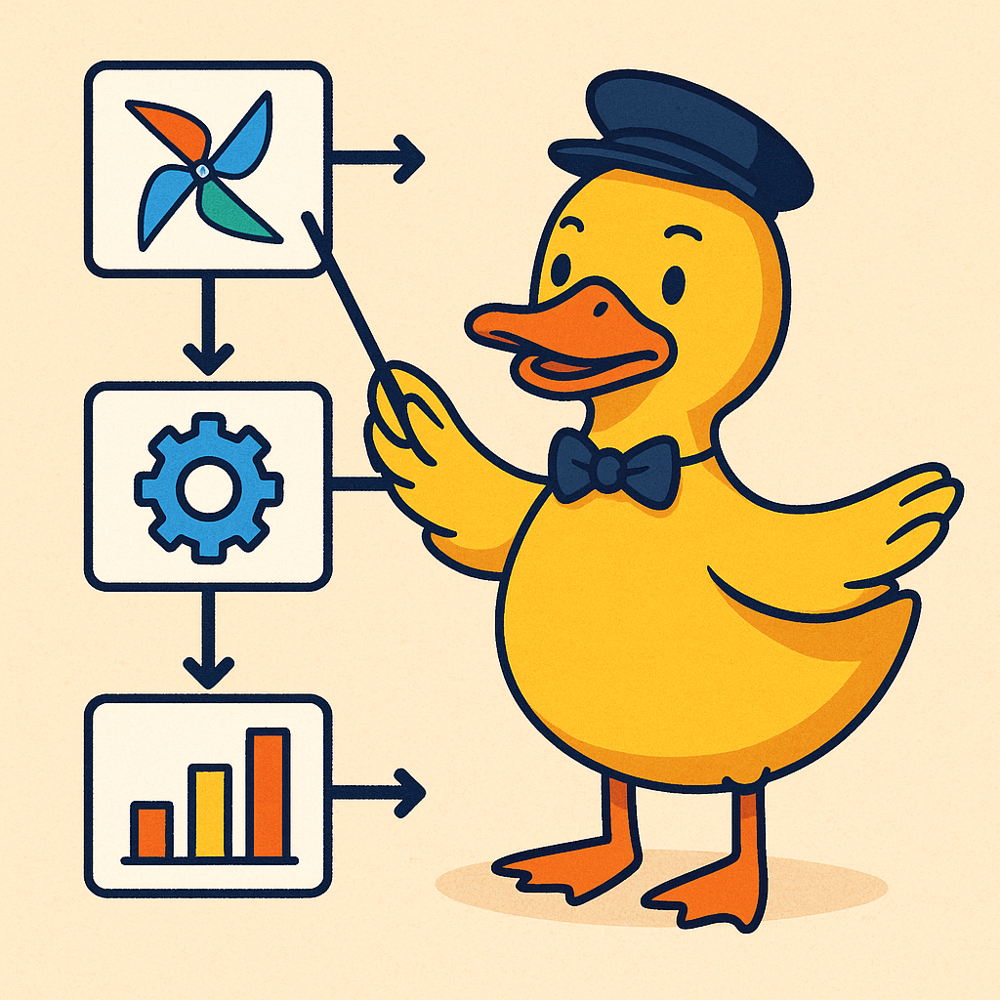

# UI amigable

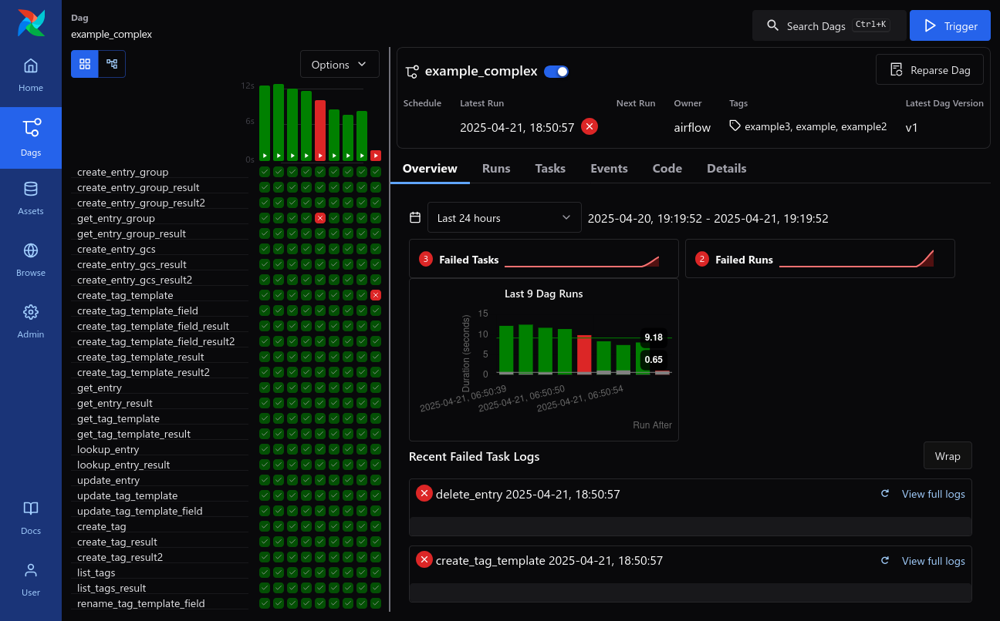

# DAG

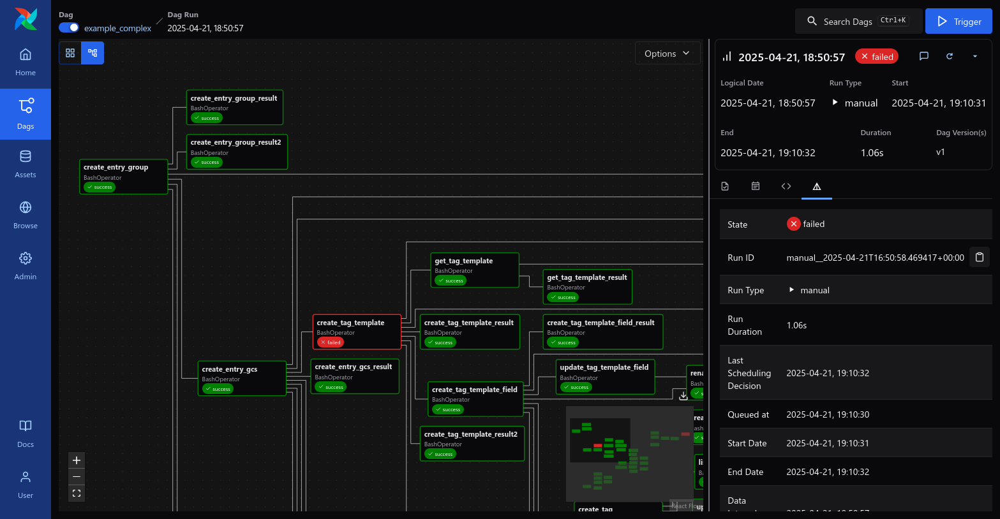

## ¿Por qué usar Apache Airflow?
Airflow permite automatizar y orquestar workflows complejos, es decir, pipelines que tienen pasos que deben ejecutarse en cierto orden, en ciertos horarios o con ciertas condiciones.

Es como tener un calendario programable de tareas que pueden ir desde mover archivos hasta entrenar modelos de machine learning.

## Casos de uso más comunes para los que Airflow es ideal:

**ETL (Extract – Transform – Load)**

Extraer datos de una fuente , transformarlos y cargarlos en un destino

Pipeline típico:
extraer: leer API

transformar: limpiar datos nulos, formatear campos, unir tablas

cargar: guardar en una base de datos o en S3

Extraer → Transformar → Cargar → Notificar éxito

**Gestión de infraestructura**

Airflow puede interactuar con cualquier API, lo que lo convierte en una herramienta excelente para administrar su infraestructura, como clústeres de Kubernetes o Spark que se ejecutan en cualquier nube.


**Machine Learning Operations**

MLOps abarca las prácticas necesarias para poner modelos de aprendizaje automático en producción de forma confiable. Airflow facilita este proceso al orquestar todos los pasos del pipeline sin depender de herramientas específicas


## Ejemplos:
**"Terminar la carrera"**


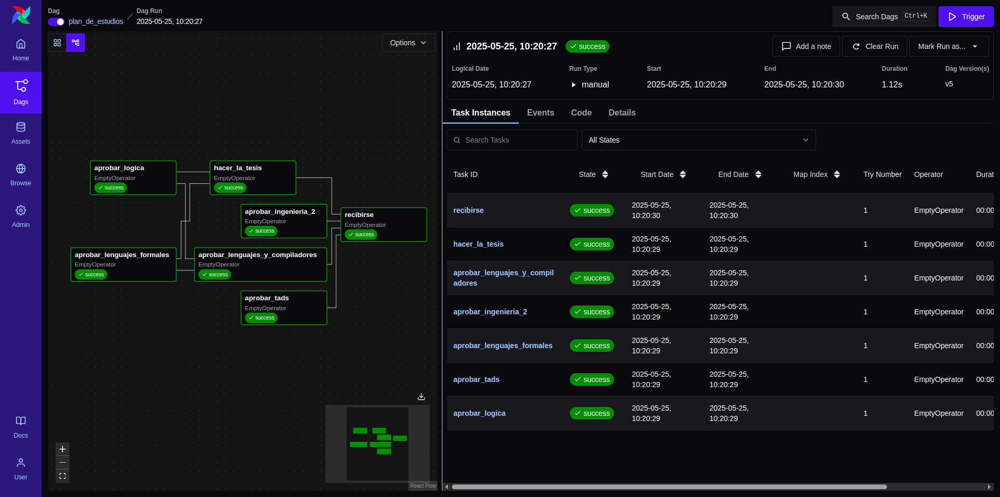


**"ETL"**


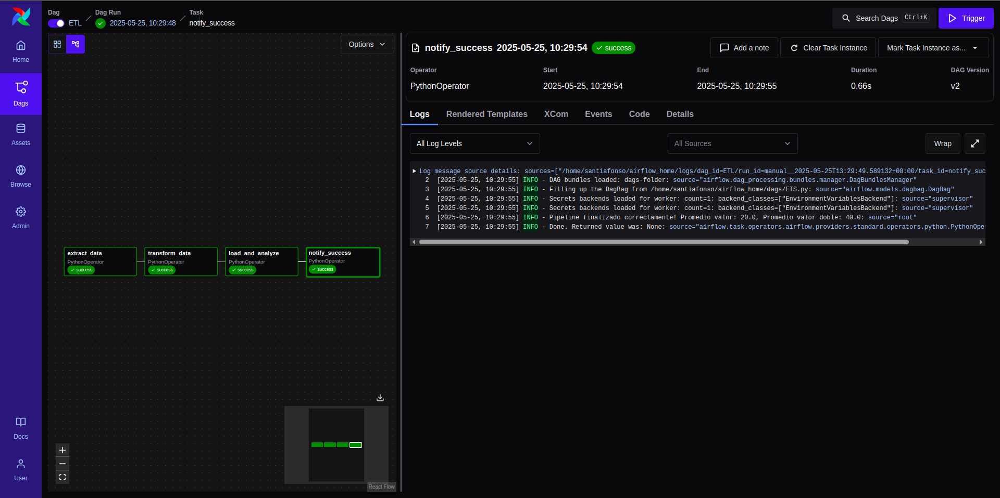

## Empresas que trabajan con Airflow

**Airbnb**

**Spotify**

**Lyft**

**Netflix**

## Diferencias

 | Característica              | **Bonobo**                         | **Luigi**                            | **Airflow**                                    |
| --------------------------- | ---------------------------------- | ------------------------------------ | ---------------------------------------------- |
| 🧩 Enfoque principal        | ETL puro (simple y estructurado)   | Pipelines batch con dependencias     | Orquestación general de flujos complejos       |
| ⚙️ Tipo de ejecución        | Local, secuencial o con threads    | Local con paralelismo limitado       | Distribuida (Celery, Kubernetes, etc.)         |
| 📦 Arquitectura             | Liviana y minimalista              | Basada en tareas y targets           | Scheduler + Executor + UI web modular          |
| 🗓️ Programación por tiempo | ❌ No integrado                     | ❌ No integrado (se usa cron)         | ✅ Sí, con expresiones tipo cron                |
| 🧠 DAGs dinámicos           | ✅ (estructura explícita en código) | ✅ (con `yield` en `run()`)           | ✅ (con `@task` o `PythonOperator`)             |
| 🖥️ UI web                  | ❌ No                               | ✅ Básica                             | ✅ Completa y moderna                           |
| 🛠️ Reintentos / monitoreo  | ❌ No                               | ❌ Limitado                           | ✅ Sí, muy configurable                         |
| 🐳 Soporte contenedores     | ❌ No                               | ❌ Limitado manual                    | ✅ Kubernetes Executor nativo                   |
| 🧪 Ideal para               | Pipelines ETL simples y lineales   | Proyectos medianos, scripts internos | Producción, ML workflows, escalado empresarial |
| 🧑 Comunidad / soporte      | Pequeña, poco activa               | Menor actividad, en mantenimiento    | Muy activa, respaldada por Apache              |S



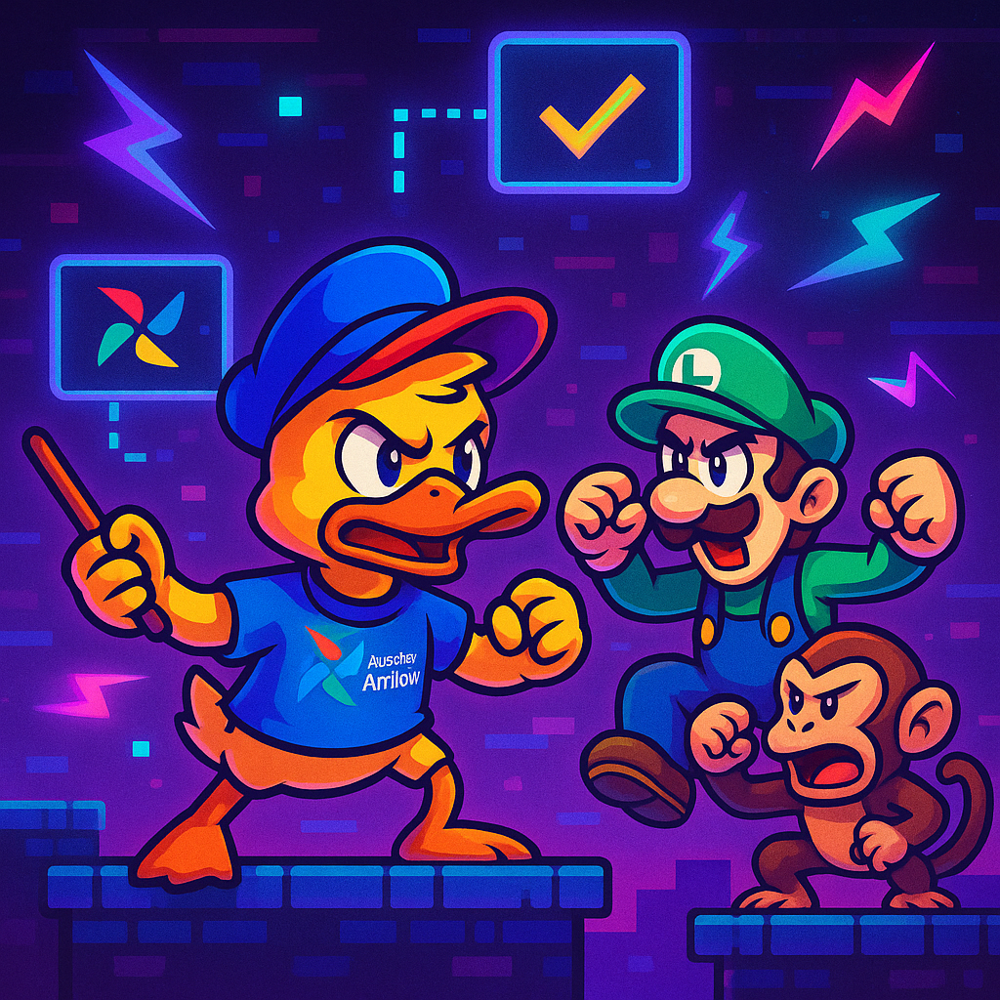